# Branching Out into Isolation Forests

### Tree Based Anomaly Detection

Stephanie Kirmer

ChiPy October 2020

In [1]:
import numpy as np
import pandas as pd
import logging as log
import os
import datetime
import typing
from typing import Callable, List
import re
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from bokeh.plotting import figure, output_notebook, show, output_file
from bokeh.models import ColorBar, ColumnDataSource
from bokeh.palettes import Spectral6, brewer
from bokeh.transform import linear_cmap, factor_cmap

from plotnine import *
import plotnine.options as pn

import matplotlib.pyplot as plt
from sklearn import tree
import graphviz

import shap
import plotly.express as px

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D

rng = np.random.RandomState(42)

# Load data 

From Kaggle - tracks on Spotify

https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data.csv

Let's identify really unusual tracks!

In [2]:
dataset = pd.read_csv("/Users/skirmer/projects/isolationforests/data/data.csv")

Characteristics of the tracks:

In [4]:
dataset.columns

Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

Examples! Let's see some highly instrumental tracks.

In [83]:
dataset.query("instrumentalness > .94")[['artists', 'name', 'year']].head(2)

,artists,name,year
2202,"['Johann Sebastian Bach', 'Pierre Fournier']","Suite For Cello Solo No.1 In G, BWV 1007: 4. S...",1961
2370,"['Lalo Schifrin', 'Bob Brookmeyer']",My Funny Valentine,1963


What about very "speechy" ones?

In [82]:
dataset.query("speechiness > .94")[['artists', 'name', 'year']].head(2)

,artists,name,year
7143,['Bill Burr'],Make My Sandwich,2010
10608,['Bill Cosby'],Sneakers,1964


Finally let's poke at the loud ones.

In [84]:
dataset.query("loudness > .94")[['artists', 'name', 'year']].head(2)

,artists,name,year
3420,['The Stooges'],Shake Appeal - Iggy Pop Mix,1973
35448,['The Stooges'],Death Trip - Iggy Pop Mix,1973


Yeah, that tracks! Sounds all right, that tells us something about these songs.

# Feature Engineering

This is going to be very minimal, because we want to get right to the model. One thing I'm doing is binning the years, and cutting off songs before 1960, just because the data is a little different before that time. We want to find songs that are truly unusual, not just weird data collection.

In [5]:
dataset = dataset.query('year > 1960')

dataset['year_bin'] = pd.cut(dataset['year'],9)

In [6]:

pn.figure_size = (7,3)
# Must downsample to get any reasonable rendering speed
plotset = dataset.sample(frac=0.2, replace=False, random_state=1)
plotset.shape

(23931, 20)

This leaves us with this feature set, for all songs listed after 1960. Also, I'm downsampling for the graphs (only those, not for the modeling) to allow us to visualize things more easily.

In [85]:
features = ['acousticness', 'explicit', 'duration_ms','instrumentalness', 'key',
            'liveness', 'loudness', 'mode', 'popularity','valence',
            'speechiness', 'tempo', 'energy', 'danceability']


# Model Training

I like to put my model training steps in a function- it keeps things tidy.

In [8]:
def fit_model(dataframe, feature_list):
    ''' Accepts dataframe and list of features to be used in model training. 
    Returns trained model object and dataset with NAs removed and anomalousness 
    features appended. '''
    
    # Handle missingness
    nd = dataframe.dropna()
    #nd = dataframe.fillna(value=0)
    
    # Train the model
    X_train2 = nd.loc[:,feature_list]
    clf = IsolationForest(n_estimators=300, max_features=5,
                          contamination=.02, random_state=rng)
    clf.fit(X_train2)
    decfn = clf.decision_function(X_train2)
    scores = clf.score_samples(X_train2) 

    # Predict, then append predictions and some other features.
    y_pred_train = clf.predict(X_train2)
    X_train2.loc[:,'preds'] = y_pred_train
    X_train2.loc[:,'preds_txt'] = X_train2.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})
    X_train2.loc[:,'decision_fn'] = decfn
    X_train2.loc[:,'scores'] = scores
    X_train2.loc[:,'year_bin'] = nd.loc[:,'year_bin']

    # Return model and the augmented data.
    return(clf, X_train2)

In [9]:
def predict_on_new(newdata, feature_list, modelobj):
    ''' Accepts dataframe, trained model object, and list of features required by model. 
    Returns dataset with NAs removed and anomalousness features appended. '''

    # Handle missingness
    nd = newdata.dropna()
    #newdata.fillna(value=0, inplace=True)
    
    # Predict
    dataframe = nd.loc[:, feature_list]
    decfn = modelobj.decision_function(dataframe)
    scores = modelobj.score_samples(dataframe)
    y_pred_test = modelobj.predict(dataframe)
    
    # Augment dataframe
    dataframe.loc[:,'preds'] = y_pred_test
    dataframe.loc[:,'preds_txt'] = dataframe.loc[:,'preds'].replace({-1:"Anomaly", 1: "Normal"})
    dataframe.loc[:,'decision_fn'] = decfn
    dataframe.loc[:,'scores'] = scores
    dataframe.loc[:,'year_bin'] = nd.loc[:,'year_bin']
    
    # Return augmented data
    return(dataframe)

In [10]:
X_train, X_test = train_test_split(dataset, test_size=0.3)

In [11]:
modobj, new_X_train= fit_model(X_train, features)

In [101]:
new_X_train[['preds','preds_txt','decision_fn','scores']].head()

,preds,preds_txt,decision_fn,scores
166709,1,Normal,0.129942,-0.433869
95784,1,Normal,0.141272,-0.422539
67008,1,Normal,0.026629,-0.537182
83796,1,Normal,0.117450,-0.446362
142253,1,Normal,0.063887,-0.499924


# Predict on Test Holdout

In [103]:
new_X_test = predict_on_new(newdata=X_test, feature_list=features, modelobj=modobj)
new_X_test[['preds','preds_txt','decision_fn','scores']].head()

,preds,preds_txt,decision_fn,scores
147830,1,Normal,0.111739,-0.452073
124596,1,Normal,0.145832,-0.417980
76648,1,Normal,0.126557,-0.437254
149009,1,Normal,0.041898,-0.521913
102332,1,Normal,0.097093,-0.466718


## Feature Importances

I'm going to use Shapley values here to evaluate which features are turning out to be most helpful in isolating our observations. Notice that the number of pertinent features is going to equal the number of features that we selected in the model training.

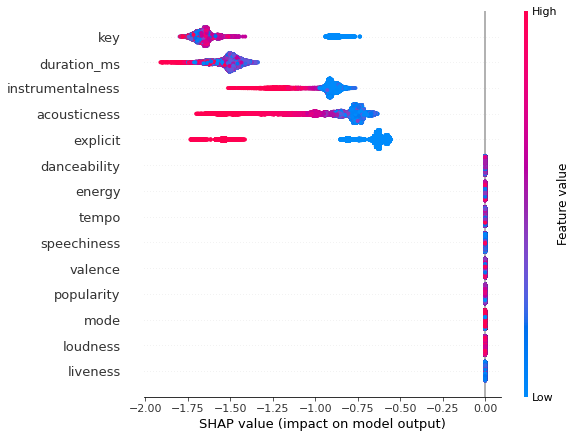

In [104]:
X_explain = new_X_test.drop(['preds', 'preds_txt', 'year_bin', 'scores', 'decision_fn'], axis=1)
shap_values = shap.TreeExplainer(modobj).shap_values(X_explain)
shap.summary_plot(shap_values, X_explain)

# Analyze Predictions


In [105]:
new_X_test['preds'].value_counts(normalize=True) * 100

 1    97.924618
-1     2.075382
Name: preds, dtype: float64

In [106]:
new_X_train['preds'].value_counts(normalize=True) * 100

 1    97.999021
-1     2.000979
Name: preds, dtype: float64

In [ ]:
output_notebook() 
# create a new plot with a title and axis labels
p = figure(title="Training Sample Score", y_axis_label='speechiness Score', x_axis_label='Tempo, bpm', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_train['tempo'], 
                                y=new_X_train['speechiness'], 
                                ur = new_X_train['preds_txt'],
                                legend_group= new_X_train['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_train.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source, fill_alpha=.75, line_alpha = .5)


In [17]:

show(p)

Loading BokehJS ...

In [ ]:
# create a new plot with a title and axis labels
p = figure(title="Test Sample Score", y_axis_label='liveness Score', x_axis_label='energy', width=700, height = 300)

source = ColumnDataSource(data=dict(x=new_X_test['energy'], 
                                y=new_X_test['liveness'], 
                                ur = new_X_test['preds_txt'],
                                legend_group= new_X_test['preds_txt']))

colors = factor_cmap('ur', palette=Spectral6, factors=new_X_test.preds_txt.unique()) 

p.circle(color=colors, legend_group = 'legend_group', source=source)


In [18]:

show(p)

## Plot Trees

We can look into the actual trees in our forest to see some of the decision choices that the model made.

This tree starts with the explicitness rating- this is actually a binary feature so it's splitting explicit songs to the right and non-explicit ones to the left. Ten percent of the observations go to the Explicit side already, so that's a helpful splitter. After that, we get tempo and valence as the second row splits. Valence means positivity or cheerfulness, more or less.

So, we get a track isolated right off the bat with explicit lyrics and low valence. That one might get a high anomalousness because the path to its isolation was so short. However, this is only one of the trees in our forest, and that track might be very like some others on characteristics besides these.

In [118]:
fig = plt.figure(figsize=(5,5))

fn=new_X_test.columns
cn=new_X_test.preds
fn2 = list(new_X_test.columns[modobj.estimators_features_[3]])

dot_data= tree.export_graphviz(modobj.estimators_[3], 
                     out_file=None, 
                      feature_names=fn2,  
                      class_names=cn,  
                      filled=True, 
                     rounded=True,
                     max_depth=3,
                      special_characters=True)  

graph = graphviz.Source(dot_data)  

<Figure size 360x360 with 0 Axes>

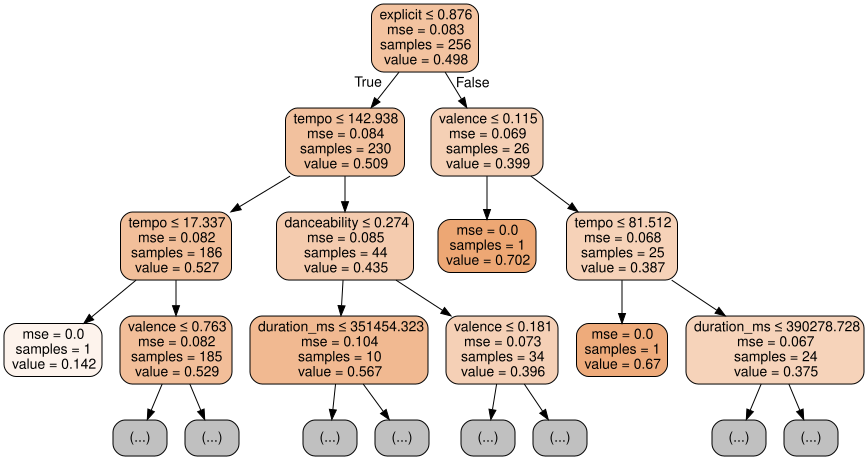

In [119]:

graph



# PCA

Another way to explore our results is to apply PCA to the features, and see where the items marked outlier by our model appear. If the model has done well, we should see our outliers on the margins and away from the center of the PCA plot.

I am randomly downsampling to allow us to visualize the data more easily.

In [120]:
downsampled = new_X_test.sample(frac=0.35, replace=False, random_state=1)
downsampled = downsampled.reset_index()
d_anoms = downsampled[downsampled['preds_txt'] == 'Anomaly']


In [121]:
outlier_index=list(d_anoms.index)
pca = PCA(n_components=3)  # Reduce to k=3 dimensions
scaler = StandardScaler()
#normalize the metrics
X = scaler.fit_transform(downsampled[features])
X_reduce = pca.fit_transform(X)

X_reduce2 = pd.DataFrame(X_reduce)
X_reduce2.head()

for i in outlier_index:
    X_reduce2.loc[i, 'outlier_index']= 'Anomaly'
    
values = {'outlier_index': 'Normal'}
X_reduce2b = X_reduce2.fillna(value=values)

X_reduce2b.head()
X_reduce2b['outlier_index'].value_counts()


Normal     12303
Anomaly      261
Name: outlier_index, dtype: int64

In [122]:
X_reduce2 = pd.DataFrame(X_reduce)
X_reduce2.head()

for i in outlier_index:
    X_reduce2.loc[i, 'outlier_index']= 'Anomaly'
    X_reduce2.loc[i, 'outlier_color']= '#ff0000'
    
values = {'outlier_index': 'Normal', 'outlier_color': '#0066ff'}
X_reduce2b = X_reduce2.fillna(value=values)

In [ ]:
import plotly.graph_objects as go

x=X_reduce2b[2]
y=X_reduce2b[0]
z=X_reduce2b[1]
col=X_reduce2b['outlier_color']

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=2,               # set color to an array/list of desired values
        color = np.array(col),
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)])


fig.update_layout(
    autosize=False,
    width=600,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=50,
        t=50,
        pad=1
    ),
)

In [25]:
fig.show()

## Other Exploration

I want to check a few other things before calling the job done. Are our anomalies pretty evenly distributed across the time periods?

In [123]:
pd.crosstab(new_X_test['preds_txt'], new_X_test['year_bin'])


year_bin,"(1960.941, 1967.556]","(1967.556, 1974.111]","(1974.111, 1980.667]","(1980.667, 1987.222]","(1987.222, 1993.778]","(1993.778, 2000.333]","(2000.333, 2006.889]","(2006.889, 2013.444]","(2013.444, 2020.0]"
preds_txt,,,,,,,,,
Anomaly,119,37,53,83,55,83,48,87,180
Normal,4045,4150,3635,4094,3497,4121,3539,4106,3965


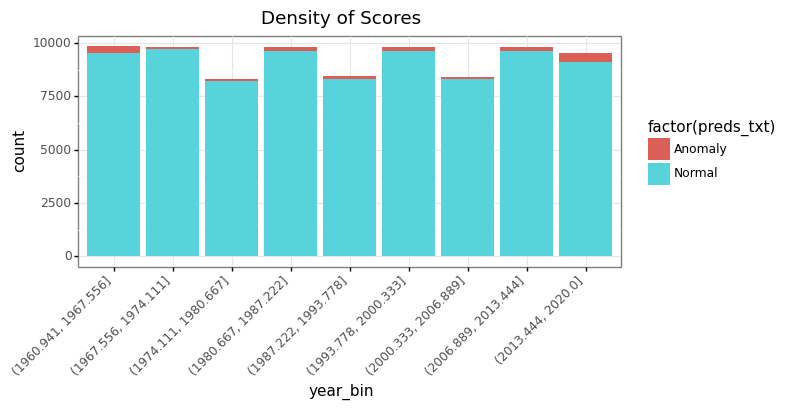

<ggplot: (324723197)>

In [28]:
(
        ggplot(new_X_train, aes(x='year_bin', fill='factor(preds_txt)'))
        + theme_bw()
        +theme(axis_text_x=element_text(rotation=45, hjust=1))
        + geom_bar()
        + labs(title = 'Density of Scores')
    )

What are the score values looking like, out of curiosity?

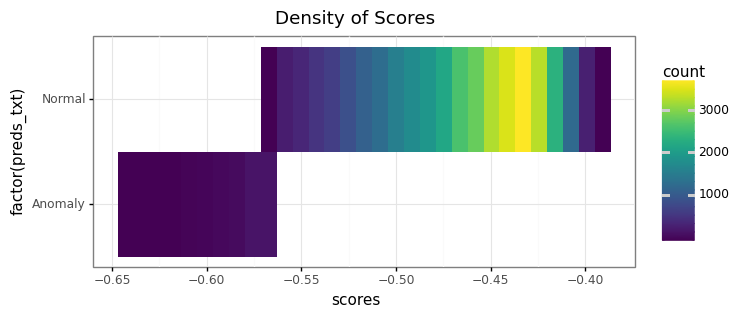

<ggplot: (324295888)>

In [27]:
(
        ggplot(new_X_test, aes(x='scores', y='factor(preds_txt)'))
        + theme_bw()
        + geom_bin2d()
        + labs(title = 'Density of Scores')
    )

## Spot Check

Now what I'd like to do is actually grab some titles and artists and just see what the model has decided is anomalous. Our data is pretty intuitive and the model is not too complex, so we ought to be able to infer what's up.

Remember that the Shapley values said that these were our major traits:
* key
* duration
* instrumentalness
* acousticness
* explicit

We'll start with a grab off the top.

In [132]:

anoms = new_X_test.query("preds_txt == 'Anomaly'")
tc = anoms.head().index
dataset.loc[tc][['artists', 'name', 'year', 'key', 'duration_ms', 'instrumentalness', 'acousticness', 'explicit']]


,artists,name,year,key,duration_ms,instrumentalness,acousticness,explicit
64854,"['Red Garland Quintet', 'John Coltrane']",Lazy Mae - Instrumental,1962,5,966773,0.747,0.928000,0
68378,['Marilyn Manson'],Posthuman,1998,9,257827,0.599,0.000008,1
139079,['The Mamas & The Papas'],The Right Somebody To Love,1968,1,40533,0.000,0.935000,0
159498,"['DJ Screw', 'K-Rino', 'Z-Ro']",The Game Goes On,2001,1,300227,0.269,0.382000,1
20015,"['Jim Morrison', 'The Doors']",Babylon Fading,1978,5,100160,0.607,0.672000,0


In [131]:
# check to make sure indexing worked, look at score too
anoms.loc[tc][['key', 'duration_ms', 'instrumentalness', 'acousticness', 'explicit', 'scores', 'preds_txt']]


,key,duration_ms,instrumentalness,acousticness,explicit,scores,preds_txt
64854,5,966773,0.747,0.928000,0,-0.569733,Anomaly
68378,9,257827,0.599,0.000008,1,-0.565472,Anomaly
139079,1,40533,0.000,0.935000,0,-0.601067,Anomaly
159498,1,300227,0.269,0.382000,1,-0.572282,Anomaly
20015,5,100160,0.607,0.672000,0,-0.588635,Anomaly


Returning to the tree we looked at from our forest, what songs do we get when we look for explicit lyrics and low valence? Looks like some death metal and that sort of thing. 

In [136]:
tc = anoms.index
full_anoms = dataset.loc[tc]
full_anoms.query('explicit == 1 & valence < .10')[['artists', 'name', 'year', 'key', 'valence', 'duration_ms', 'instrumentalness', 'acousticness', 'explicit']].head()


,artists,name,year,key,valence,duration_ms,instrumentalness,acousticness,explicit
106152,['Asking Alexandria'],Not The American Average,2009,2,0.0685,279227,0.000,0.030500,1
166119,['Subhumans'],Subvert City,1983,11,0.0392,254667,0.000,0.055300,1
13597,['Darkthrone'],Transilvanian Hunger - Studio,1994,4,0.0215,369760,0.447,0.016000,1
22115,['Mushroomhead'],Before I Die,1999,11,0.0626,192986,0.779,0.000007,1
143908,"['Killstation', 'Brennan Savage', 'Ghostemane'...",Homecoming,2016,10,0.0696,272562,0.265,0.001140,1


What about not explicit lyrics but absurdly low tempo, from the other branch?

Here we find tempo = 0! That seems wrong, but if we look closer, some of these are marked silent, and others are white noise. That's actually plausible then.

It definitely seems as though tracks like these make for odd data about their actual characteristics.

In [139]:
full_anoms.query('explicit == 0 & tempo < 18')[['artists', 'name', 'year', 'key', 'tempo', 'duration_ms', 'instrumentalness', 'acousticness', 'explicit']].head()


,artists,name,year,key,tempo,duration_ms,instrumentalness,acousticness,explicit
23900,['Sound Carrie'],Loopable Sound - Flight 2021,2017,7,0.0,158984,0.973,0.908000,0
97314,['Rain Sounds'],Sleep Rain,2015,1,0.0,66860,0.831,0.000003,0
31147,['Baby Sweet Dream'],Pure White Noise,2010,6,0.0,300000,0.420,0.690000,0
106728,['Sound Library XL'],Sleep Rain,2014,7,0.0,109126,0.818,0.000000,0
61972,['Atlas Fret'],(silent track),2007,0,0.0,132827,0.000,0.000000,0


# Conclusion

To recap, here's what we did:
* Explored dataset
* Trained an isolation forest model and predicted on a test sample
* Examined some of the trees in the model
* Plotted the data with PCA to confirm outliers being identified
* Spot checked records

I hope that you can use this in your own projects in the future! Thank you!
